In [1]:
import os
import numpy as np
from tqdm import tqdm
import cv2 as cv
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

from keras import Model
from keras.callbacks import Callback
from keras.optimizers import Adam
from keras.utils import plot_model
from keras.layers import Input, Conv2D, Conv2DTranspose, MaxPooling2D, concatenate, Dropout

/home/yifan/.local/lib/python3.10/site-packages/matplotlib/projections/__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "
2025-04-29 15:26:33.469017: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-04-29 15:26:33.735996: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1745965593.830334    4929 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory f

In [2]:
image_path = '../temp/training/Images/'
mask_path = '../temp/training/Masks/'
SIZE = 128

In [3]:
# lists of images and masks names
image_names = sorted(next(os.walk(image_path))[-1])
mask_names = sorted(next(os.walk(mask_path))[-1])

images = np.zeros(shape=(len(image_names),SIZE, SIZE, 3))
masks = np.zeros(shape=(len(image_names),SIZE, SIZE, 1))

for id in tqdm(range(len(image_names)), desc="Images"):
  path = image_path + image_names[id]
  img = np.asarray(Image.open(path)).astype('float')/255.
  img = cv.resize(img, (SIZE,SIZE), cv.INTER_AREA)
  images[id] = img

for id in tqdm(range(len(mask_names)), desc="Mask"):
  path = mask_path + mask_names[id]
  mask = np.asarray(Image.open(path)).astype('float')/255.
  mask = cv.resize(mask, (SIZE,SIZE), cv.INTER_AREA)
  masks[id] = mask[:,:,:1]

Images:   0%|          | 0/4320 [00:00<?, ?it/s]

Mask: 100%|██████████| 4320/4320 [00:15<00:00, 277.71it/s] 


In [4]:
# Train test split
# images_train, images_test, mask_train, mask_test = train_test_split(images, masks, test_size=0.01)

# Train test split with no images left for testing
images_train = images
images_test = []
mask_train = masks
mask_test = []

print(f'Train images: {len(images_train)}')
print(f'Test images: {len(images_test)}')

Train images: 4320
Test images: 0


In [5]:
# Define U-net architecture
def unet_model(input_layer, start_neurons):
    # Contraction path
    conv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(input_layer)
    conv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(conv1)
    pool1 = MaxPooling2D((2, 2))(conv1)
    pool1 = Dropout(0.25)(pool1)

    conv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(pool1)
    conv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(conv2)
    pool2 = MaxPooling2D((2, 2))(conv2)
    pool2 = Dropout(0.5)(pool2)

    conv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(pool2)
    conv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(conv3)
    pool3 = MaxPooling2D((2, 2))(conv3)
    pool3 = Dropout(0.5)(pool3)

    conv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(pool3)
    conv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(conv4)
    pool4 = MaxPooling2D((2, 2))(conv4)
    pool4 = Dropout(0.5)(pool4)

    # Middle
    convm = Conv2D(start_neurons*16, kernel_size=(3, 3), activation="relu", padding="same")(pool4)
    convm = Conv2D(start_neurons*16, kernel_size=(3, 3), activation="relu", padding="same")(convm)
    
    # Expansive path
    deconv4 = Conv2DTranspose(start_neurons*8, kernel_size=(3, 3), strides=(2, 2), padding="same")(convm)
    uconv4 = concatenate([deconv4, conv4])
    uconv4 = Dropout(0.5)(uconv4)
    uconv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(uconv4)
    uconv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(uconv4)

    deconv3 = Conv2DTranspose(start_neurons*4, kernel_size=(3, 3), strides=(2, 2), padding="same")(uconv4)
    uconv3 = concatenate([deconv3, conv3])
    uconv3 = Dropout(0.5)(uconv3)
    uconv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(uconv3)
    uconv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(uconv3)

    deconv2 = Conv2DTranspose(start_neurons*2, kernel_size=(3, 3), strides=(2, 2), padding="same")(uconv3)
    uconv2 = concatenate([deconv2, conv2])
    uconv2 = Dropout(0.5)(uconv2)
    uconv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(uconv2)
    uconv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(uconv2)

    deconv1 = Conv2DTranspose(start_neurons*1, kernel_size=(3, 3), strides=(2, 2), padding="same")(uconv2)
    uconv1 = concatenate([deconv1, conv1])
    uconv1 = Dropout(0.5)(uconv1)
    uconv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(uconv1)
    uconv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(uconv1)
    
    # Last conv and output
    output_layer = Conv2D(1, (1,1), padding="same", activation="sigmoid")(uconv1)
    
    return output_layer

In [6]:
# Compile unet model
input_layer = Input((SIZE, SIZE, 3))
output_layer = unet_model(input_layer = input_layer, start_neurons = 16)

model = Model(input_layer, output_layer)
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])
model.summary()

I0000 00:00:1745965635.739468    4929 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 9542 MB memory:  -> device: 0, name: NVIDIA GeForce GTX 1080 Ti, pci bus id: 0000:01:00.0, compute capability: 6.1


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 128, 128,  │        448 │ input_layer[0][0] │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 128, 128,  │      2,320 │ conv2d[0][0]      │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 64, 64,    │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 64, 64,    │          0 │ max_pooling2d[0]… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 64, 64,    │      4,640 │ dropout[0][0]     │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 64, 64,    │      9,248 │ conv2d_2[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 32, 32,    │          0 │ conv2d_3[0][0]    │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 32, 32,    │          0 │ max_pooling2d_1[… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 32, 32,    │     18,496 │ dropout_1[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 32, 32,    │     36,928 │ conv2d_4[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 16, 16,    │          0 │ conv2d_5[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 16, 16,    │          0 │ max_pooling2d_2[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 16, 16,    │     73,856 │ dropout_2[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 16, 16,    │    147,584 │ conv2d_6[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 8, 8, 128) │          0 │ conv2d_7[0][0]    │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_3 (Dropout) │ (None, 8, 8, 128) │          0 │ max_pooling2d_3[

 Total params: 2,158,705 (8.23 MB)

 Trainable params: 2,158,705 (8.23 MB)

 Non-trainable params: 0 (0.00 B)

In [7]:
# Post Process
def mask_threshold(image, threshold=0.25):
  return image>threshold

# Callback to show progress of learning on the images after each epoch
class ShowProgress(Callback):
  def __init__(self, save=False):
    self.save = save
  def on_epoch_end(self, epoch, logs=None):
    k = np.random.randint(len(images_train))
    original_image = images_train[k][np.newaxis,...]
    predicted_mask = self.model.predict(original_image).reshape(128,128)
    proc_mask02 = mask_threshold(predicted_mask, threshold=0.2)
    proc_mask03 = mask_threshold(predicted_mask, threshold=0.3)
    proc_mask04 = mask_threshold(predicted_mask, threshold=0.4)
    proc_mask05 = mask_threshold(predicted_mask, threshold=0.5)
    mask = mask_train[k].reshape(128,128)

    plt.figure(figsize=(15,10))

    plt.subplot(1,7,1)
    plt.imshow(original_image[0]);plt.title('Orginal Image')

    plt.subplot(1,7,2)
    plt.imshow(predicted_mask, cmap='gray');plt.title('Predicted Mask')
    
    plt.subplot(1,7,3)
    plt.imshow(mask, cmap='gray');plt.title('Orginal Mask')

    plt.subplot(1,7,4)
    plt.imshow(proc_mask02, cmap='gray');plt.title('Processed: 0.2')

    plt.subplot(1,7,5)
    plt.imshow(proc_mask03, cmap='gray');plt.title('Processed: 0.3')

    plt.subplot(1,7,6)
    plt.imshow(proc_mask04, cmap='gray');plt.title('Processed: 0.4')

    plt.subplot(1,7,6)
    plt.imshow(proc_mask05, cmap='gray');plt.title('Processed: 0.5')

    plt.tight_layout()
    plt.show()

Epoch 1/100


I0000 00:00:1745965670.770975    5066 service.cc:148] XLA service 0x7f4818002f60 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1745965670.771204    5066 service.cc:156]   StreamExecutor device (0): NVIDIA GeForce GTX 1080 Ti, Compute Capability 6.1
2025-04-29 15:27:50.868421: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1745965671.206825    5066 cuda_dnn.cc:529] Loaded cuDNN version 90300
2025-04-29 15:27:51.876918: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{} for conv (f32[32,16,128,128]{3,2,1,0}, u8[0]{0}) custom-call(f32[32,3,128,128]{3,2,1,0}, f32[16,3,3,3]{3,2,1,0}, f32[16]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"cudnn_conv_backend_con

  1/135 ━━━━━━━━━━━━━━━━━━━━ 26:05 12s/step - accuracy: 0.3640 - loss: 0.6963

2025-04-29 15:28:00.501775: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'input_transpose_fusion_4', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_transpose_fusion', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1745965680.533352    5066 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - accuracy: 0.6842 - loss: 0.5333

2025-04-29 15:28:06.768596: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{} for conv (f32[1,16,128,128]{3,2,1,0}, u8[0]{0}) custom-call(f32[1,3,128,128]{3,2,1,0}, f32[16,3,3,3]{3,2,1,0}, f32[16]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"cudnn_conv_backend_config":{"activation_mode":"kRelu","conv_result_scale":1,"leakyrelu_alpha":0,"side_input_scale":0},"force_earliest_schedule":false,"operation_queue_id":"0","wait_on_operation_queues":[]}
2025-04-29 15:28:06.792359: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{} for conv (f32[1,16,128,128]{3,2,1,0}, u8[0]{0}) custom-call(f32[1,16,128,128]{3,2,1,0}, f32[16,16,3,3]{3,2,1,0}, f32[16]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 764ms/step


2025-04-29 15:28:07.214676: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{} for conv (f32[1,16,128,128]{3,2,1,0}, u8[0]{0}) custom-call(f32[1,32,128,128]{3,2,1,0}, f32[16,32,3,3]{3,2,1,0}, f32[16]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"cudnn_conv_backend_config":{"activation_mode":"kRelu","conv_result_scale":1,"leakyrelu_alpha":0,"side_input_scale":0},"force_earliest_schedule":false,"operation_queue_id":"0","wait_on_operation_queues":[]}


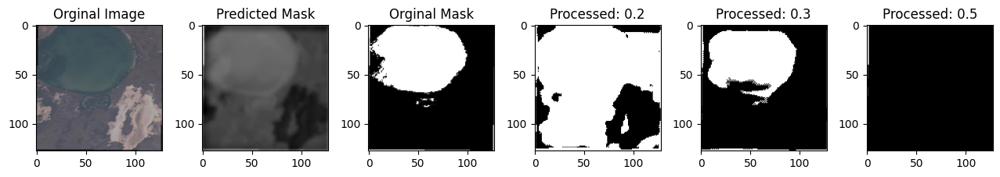

135/135 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.6844 - loss: 0.5326
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7490 - loss: 0.34


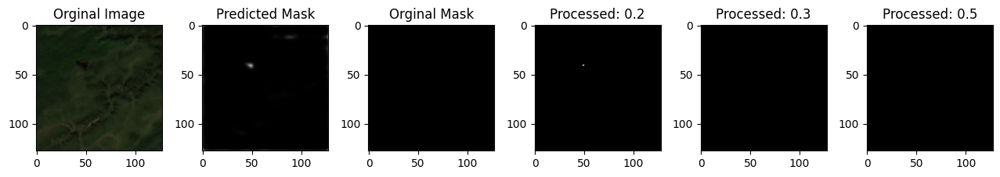

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step - accuracy: 0.7491 - loss: 0.3418
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7768 - loss: 0.304


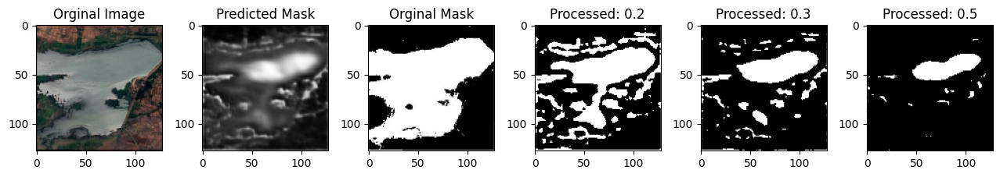

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.7768 - loss: 0.3041
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7758 - loss: 0.30


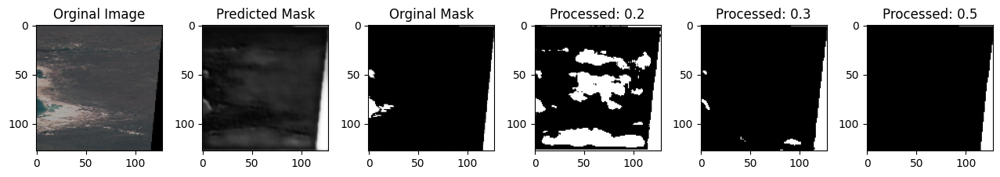

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.7758 - loss: 0.3021
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7829 - loss: 0.28


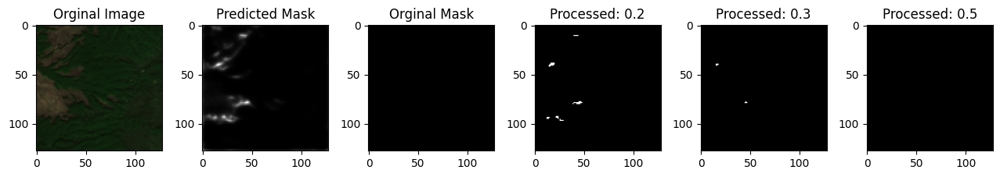

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.7830 - loss: 0.2813
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7927 - loss: 0.26


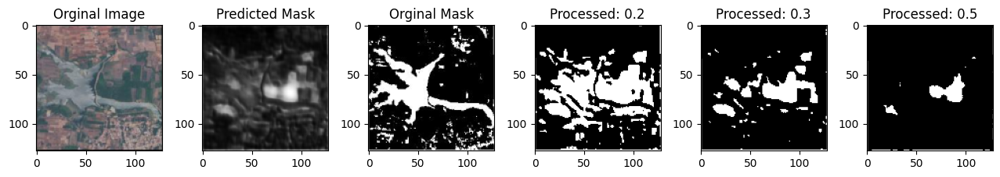

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.7927 - loss: 0.2619
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.7854 - loss: 0.26


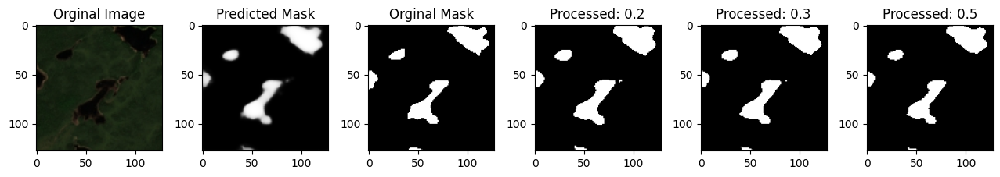

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.7855 - loss: 0.2654
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7957 - loss: 0.254


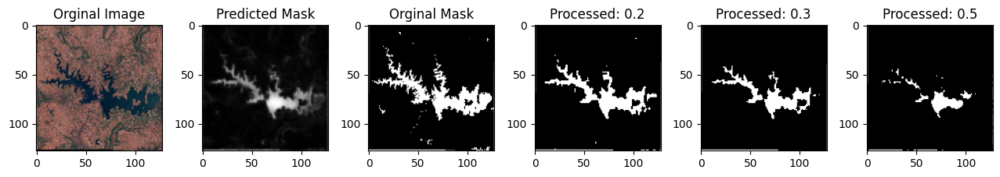

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.7957 - loss: 0.2543
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7937 - loss: 0.255


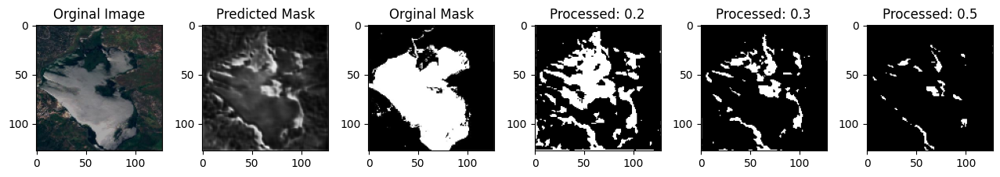

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.7937 - loss: 0.2557
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7967 - loss: 0.242


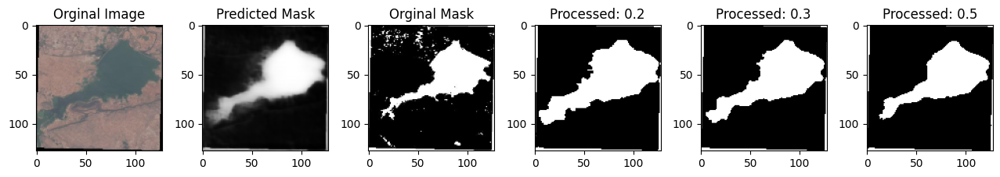

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.7968 - loss: 0.2421
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7965 - loss: 0.241


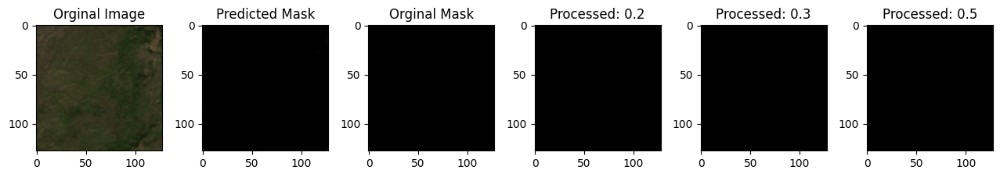

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.7966 - loss: 0.2411
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.8025 - loss: 0.23


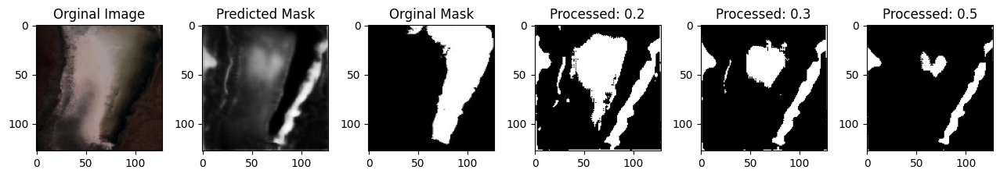

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8026 - loss: 0.2343
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8082 - loss: 0.22


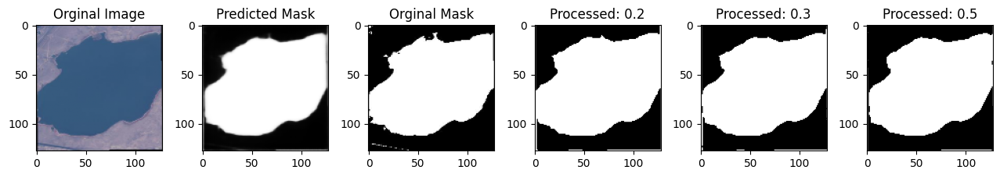

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8082 - loss: 0.2221
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8016 - loss: 0.22


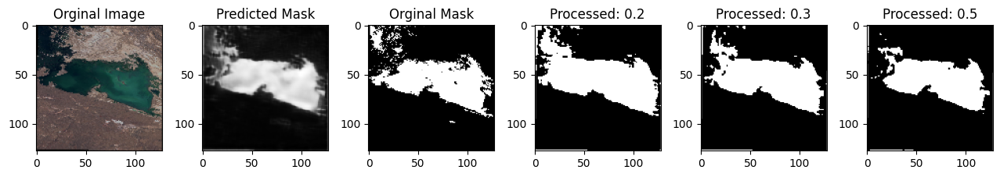

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8017 - loss: 0.2290
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.8055 - loss: 0.22


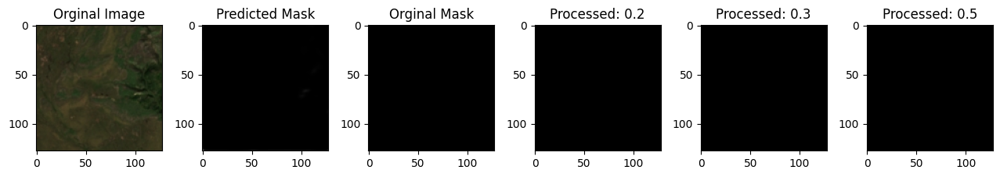

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8055 - loss: 0.2227
Epoch 16/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8112 - loss: 0.21


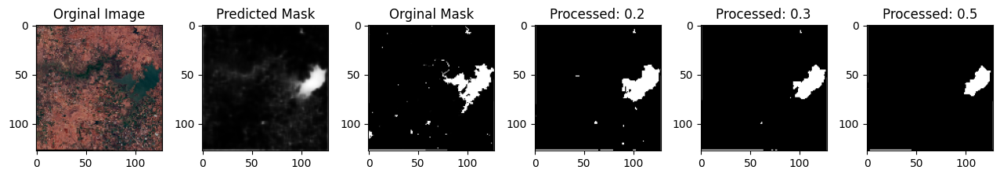

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8111 - loss: 0.2139
Epoch 17/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8079 - loss: 0.20


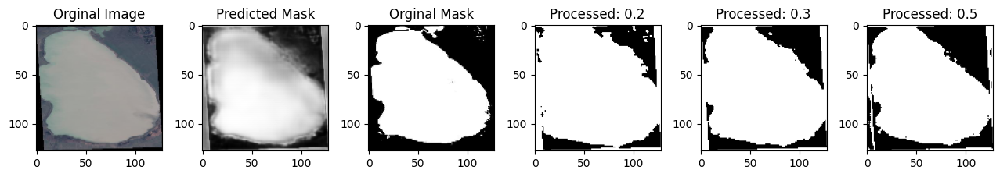

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8080 - loss: 0.2094
Epoch 18/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8136 - loss: 0.20


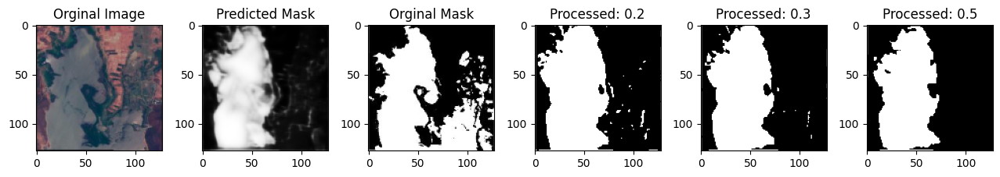

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8136 - loss: 0.2030
Epoch 19/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8177 - loss: 0.20


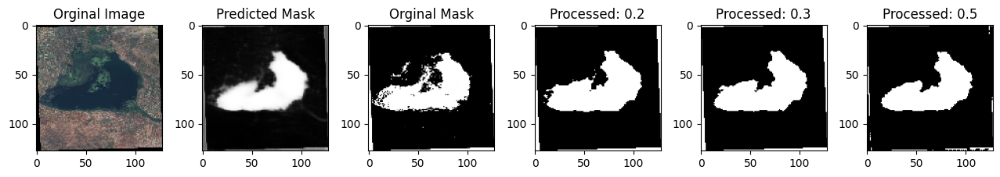

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8176 - loss: 0.2018
Epoch 20/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8163 - loss: 0.20


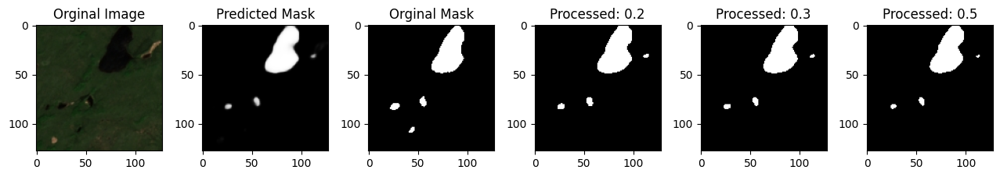

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8163 - loss: 0.2007
Epoch 21/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8090 - loss: 0.20


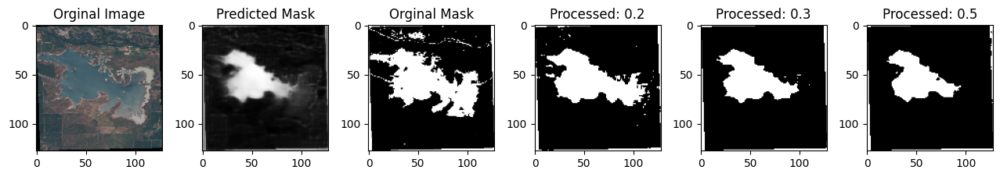

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8091 - loss: 0.2087
Epoch 22/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8163 - loss: 0.20


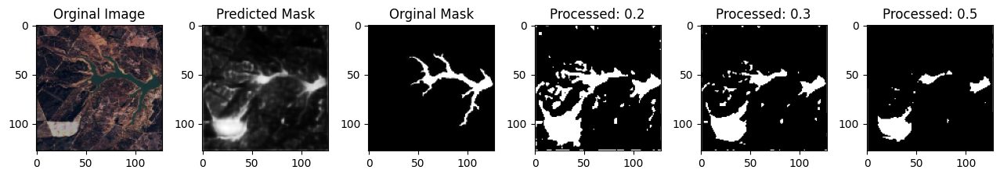

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8162 - loss: 0.2005
Epoch 23/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8226 - loss: 0.19


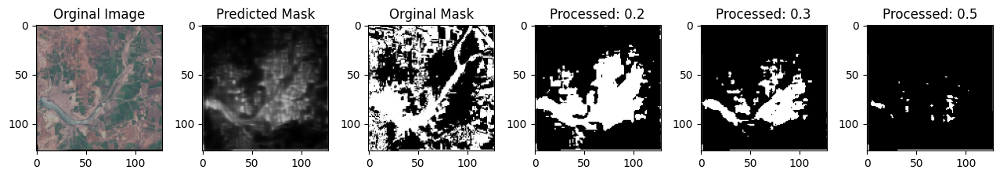

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8226 - loss: 0.1917
Epoch 24/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8239 - loss: 0.18


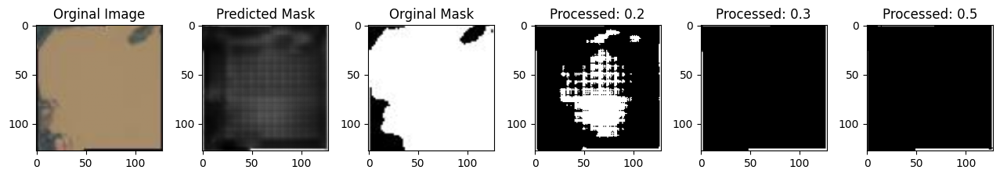

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8239 - loss: 0.1839
Epoch 25/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8174 - loss: 0.19


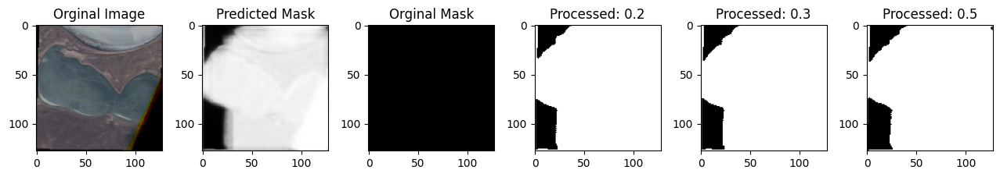

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step - accuracy: 0.8174 - loss: 0.1963
Epoch 26/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8184 - loss: 0.18


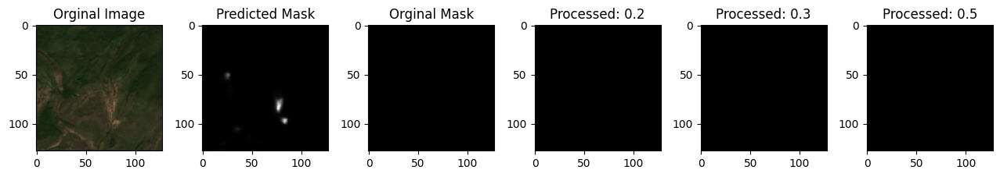

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step - accuracy: 0.8185 - loss: 0.1832
Epoch 27/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8220 - loss: 0.18


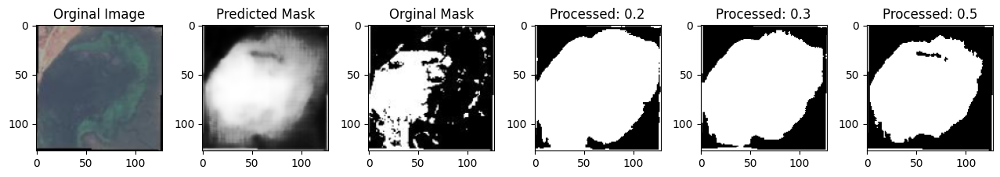

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step - accuracy: 0.8220 - loss: 0.1847
Epoch 28/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8240 - loss: 0.18


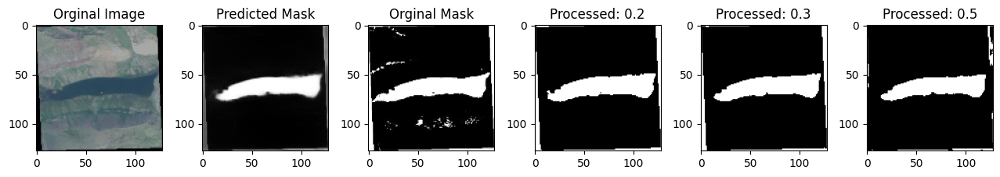

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step - accuracy: 0.8240 - loss: 0.1822
Epoch 29/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8210 - loss: 0.17


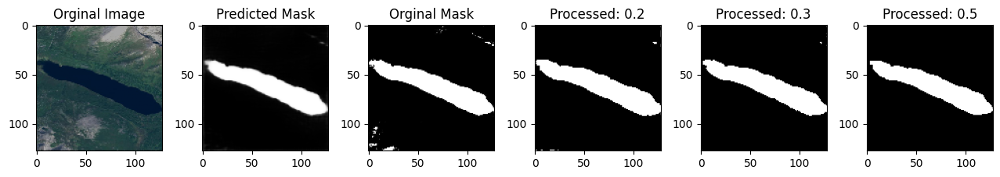

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step - accuracy: 0.8210 - loss: 0.1787
Epoch 30/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8215 - loss: 0.181


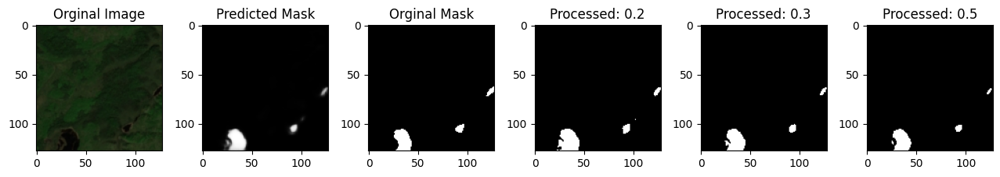

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step - accuracy: 0.8215 - loss: 0.1814
Epoch 31/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8233 - loss: 0.18


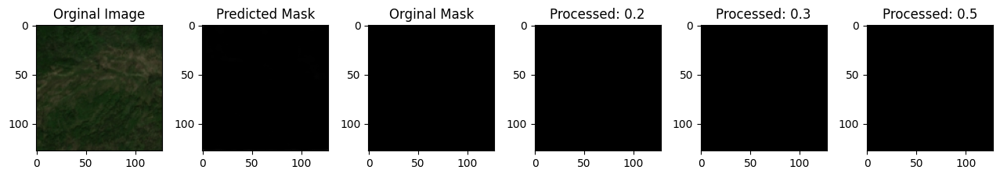

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8233 - loss: 0.1817
Epoch 32/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8067 - loss: 0.207


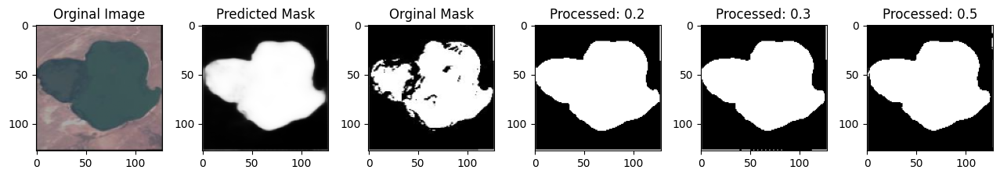

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step - accuracy: 0.8067 - loss: 0.2072
Epoch 33/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8193 - loss: 0.18


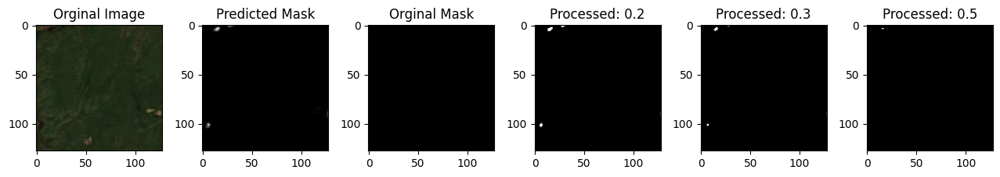

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step - accuracy: 0.8194 - loss: 0.1845
Epoch 34/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8240 - loss: 0.177


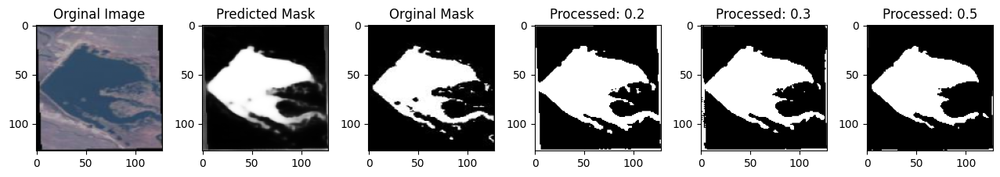

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8240 - loss: 0.1773
Epoch 35/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8229 - loss: 0.180


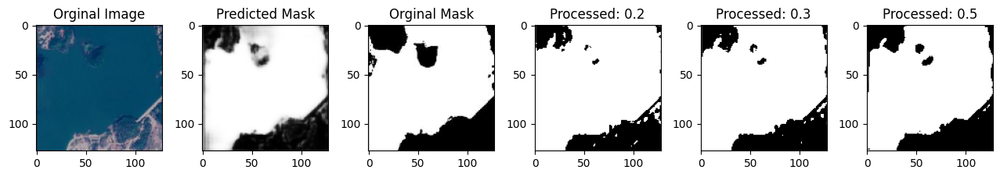

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8229 - loss: 0.1804
Epoch 36/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8251 - loss: 0.173


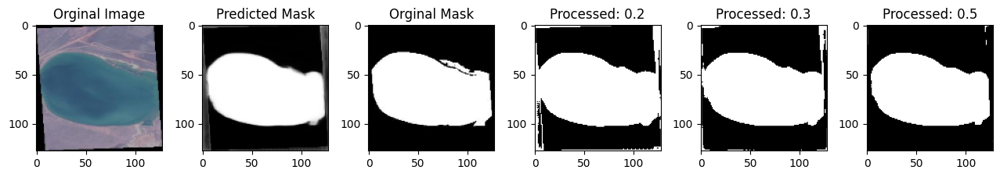

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8251 - loss: 0.1738
Epoch 37/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8262 - loss: 0.16


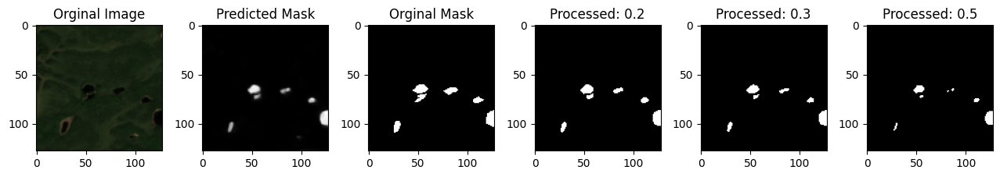

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8262 - loss: 0.1678
Epoch 38/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8274 - loss: 0.16


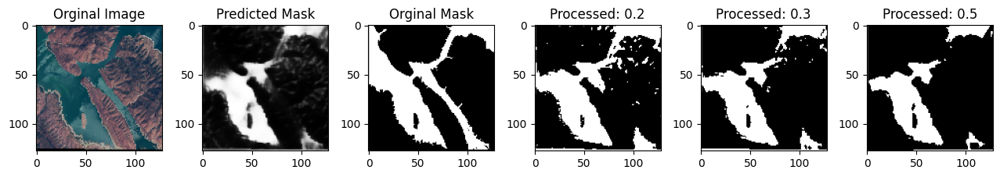

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8274 - loss: 0.1688
Epoch 39/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8257 - loss: 0.170


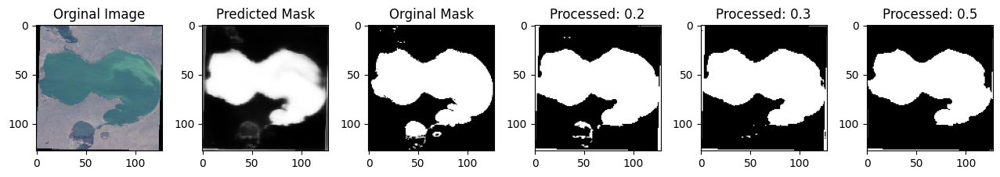

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8257 - loss: 0.1703
Epoch 40/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8193 - loss: 0.18


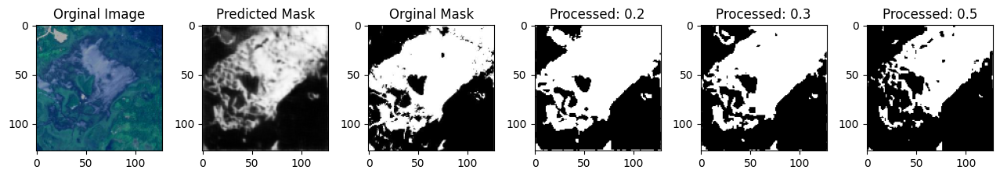

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8194 - loss: 0.1843
Epoch 41/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8295 - loss: 0.16


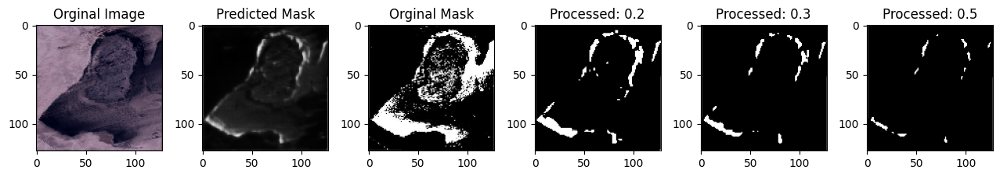

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8295 - loss: 0.1646
Epoch 42/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8235 - loss: 0.17


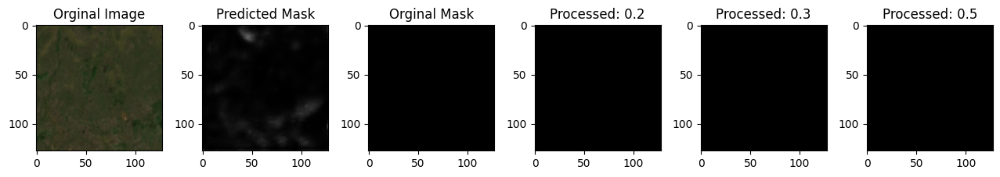

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8236 - loss: 0.1704
Epoch 43/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8239 - loss: 0.183


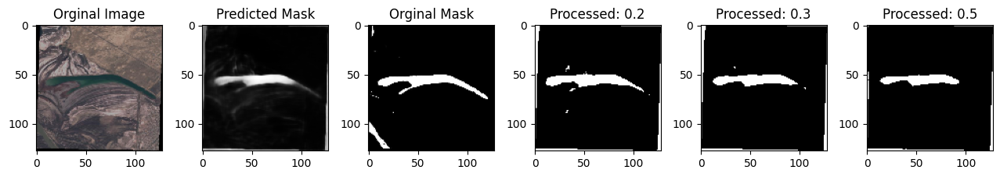

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8239 - loss: 0.1838
Epoch 44/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8233 - loss: 0.17


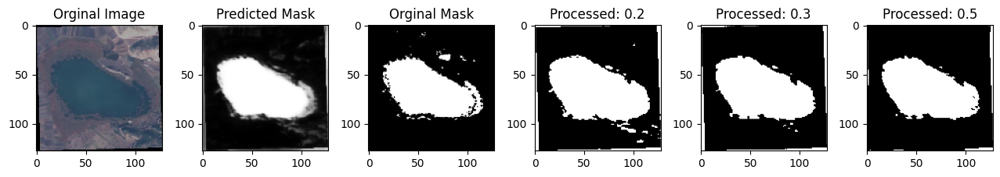

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8233 - loss: 0.1730
Epoch 45/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8263 - loss: 0.17


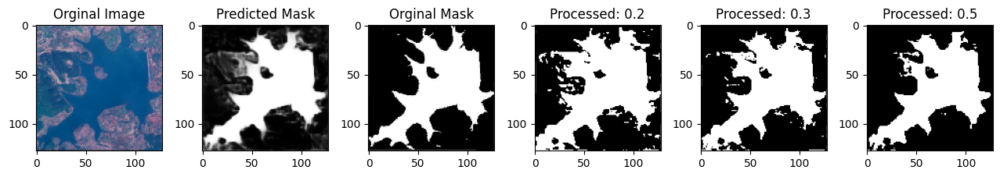

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8263 - loss: 0.1735
Epoch 46/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8285 - loss: 0.16


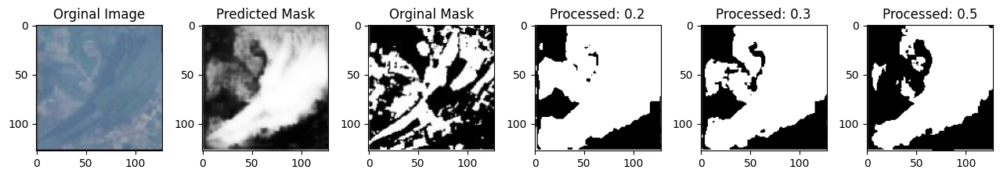

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8285 - loss: 0.1605
Epoch 47/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8254 - loss: 0.16


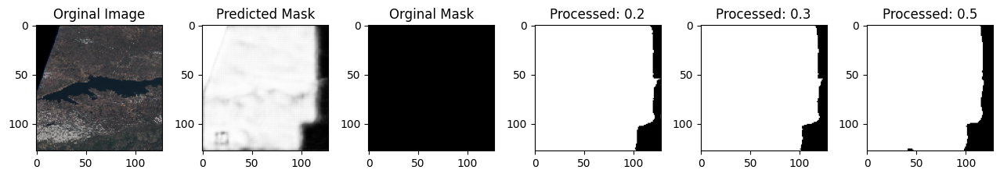

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8255 - loss: 0.1676
Epoch 48/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8227 - loss: 0.165


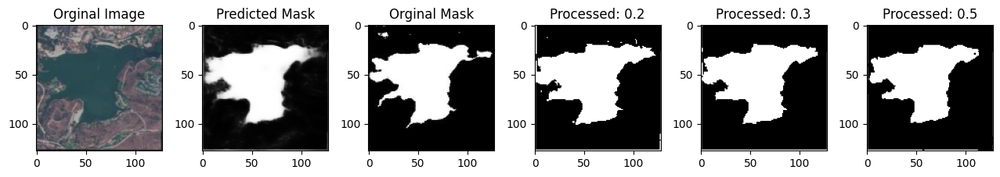

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.8227 - loss: 0.1658
Epoch 49/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8277 - loss: 0.166


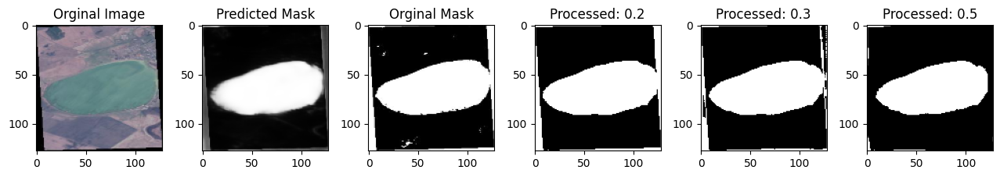

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8277 - loss: 0.1661
Epoch 50/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/stepstep - accuracy: 0.8278 - loss: 0.174


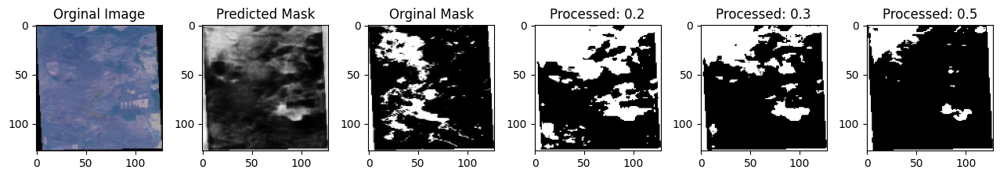

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8278 - loss: 0.1741
Epoch 51/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8297 - loss: 0.15


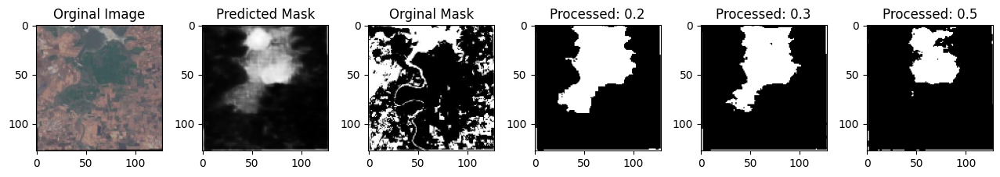

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8297 - loss: 0.1581
Epoch 52/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8229 - loss: 0.17


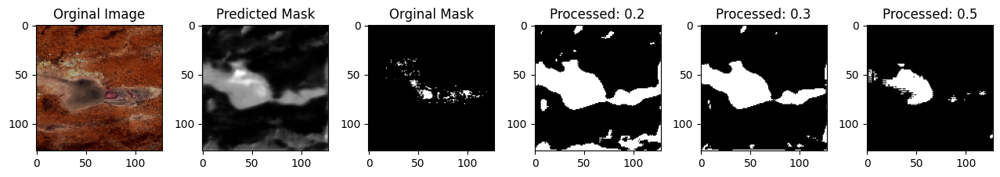

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8229 - loss: 0.1761
Epoch 53/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8297 - loss: 0.160


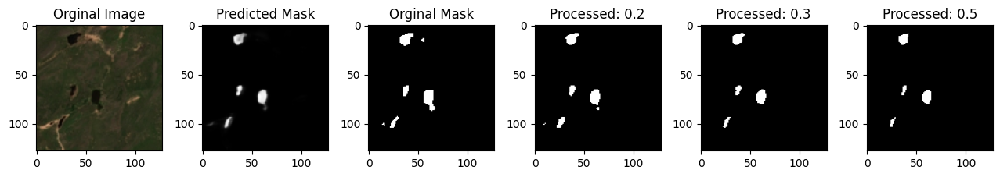

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8296 - loss: 0.1602
Epoch 54/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8309 - loss: 0.156


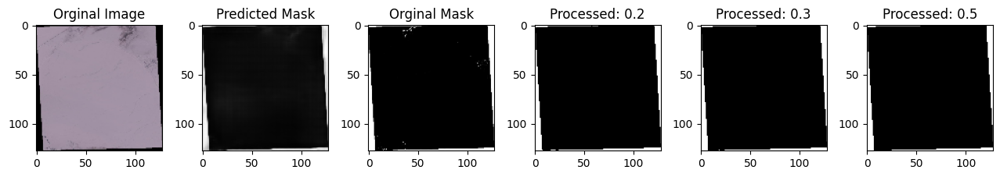

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8309 - loss: 0.1562
Epoch 55/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8372 - loss: 0.151


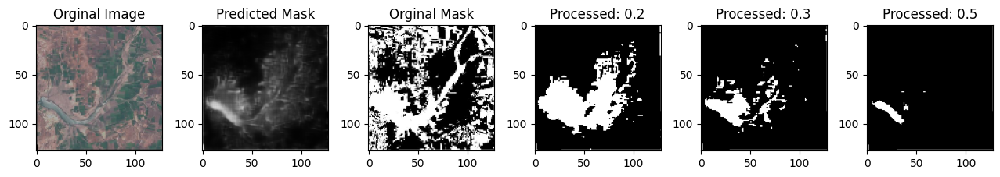

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8372 - loss: 0.1519
Epoch 56/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8305 - loss: 0.15


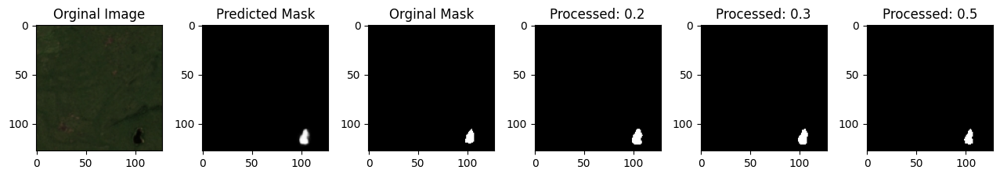

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.8305 - loss: 0.1589
Epoch 57/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8306 - loss: 0.156


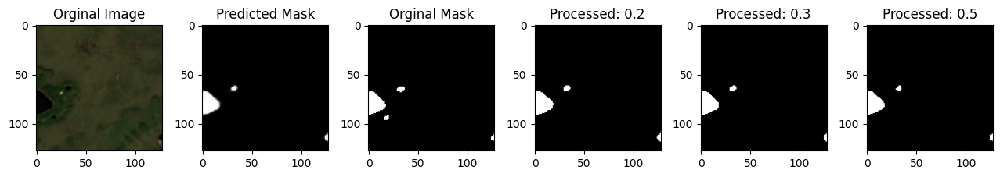

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.8306 - loss: 0.1566
Epoch 58/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8269 - loss: 0.157


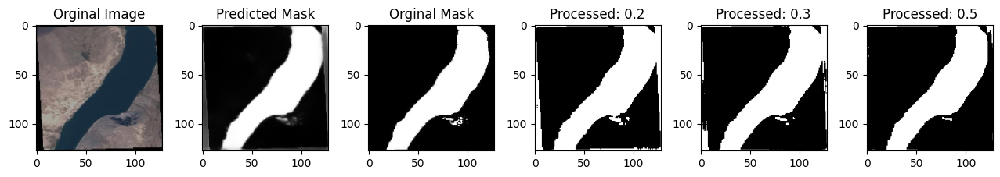

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step - accuracy: 0.8269 - loss: 0.1571
Epoch 59/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8299 - loss: 0.15


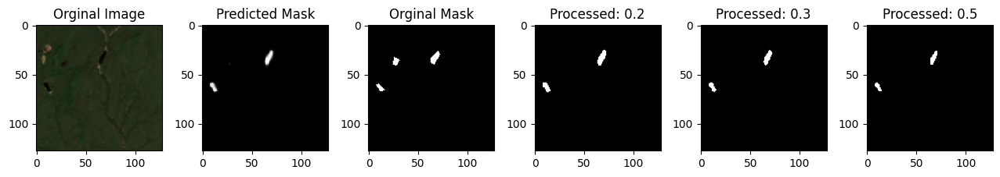

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.8299 - loss: 0.1577
Epoch 60/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8331 - loss: 0.15


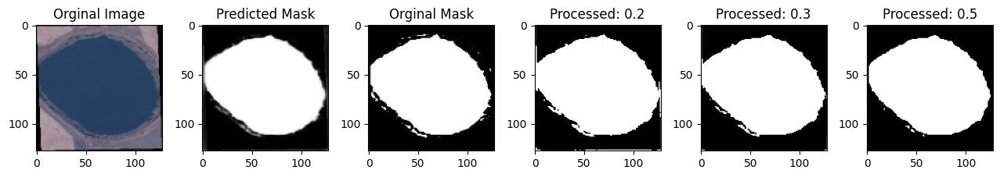

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8331 - loss: 0.1564
Epoch 61/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.8310 - loss: 0.15


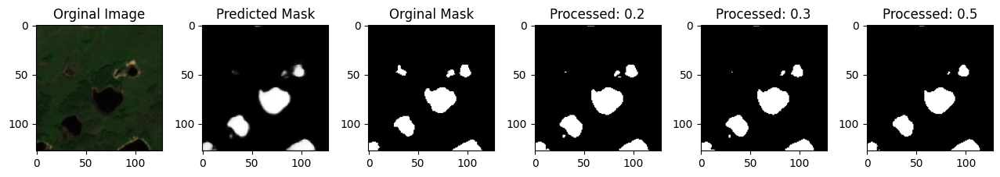

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8310 - loss: 0.1528
Epoch 62/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8301 - loss: 0.154


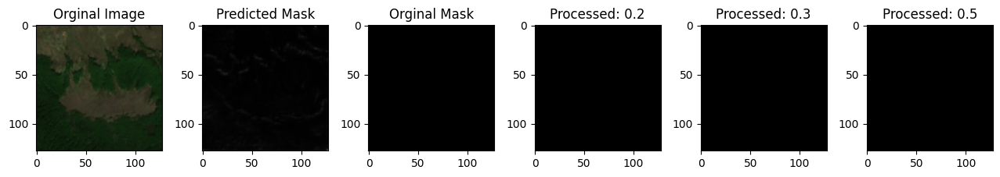

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8302 - loss: 0.1541
Epoch 63/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8351 - loss: 0.14


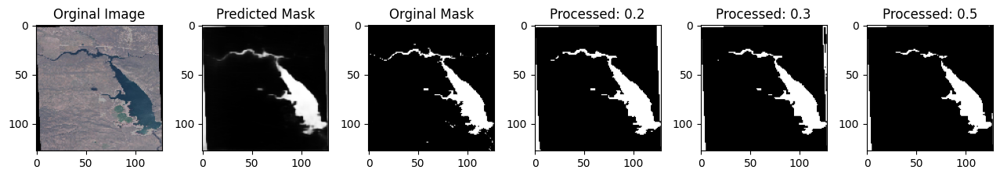

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8350 - loss: 0.1487
Epoch 64/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8321 - loss: 0.14


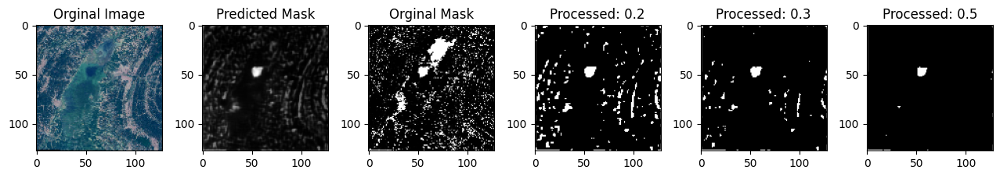

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8321 - loss: 0.1492
Epoch 65/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8342 - loss: 0.145


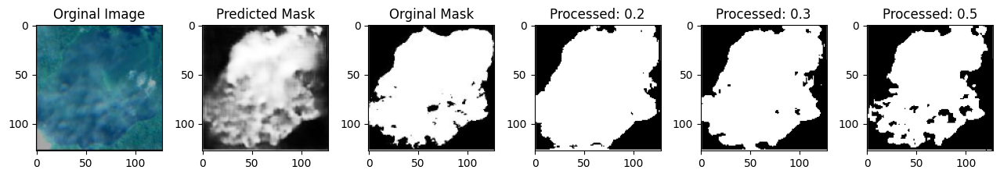

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8342 - loss: 0.1451
Epoch 66/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8346 - loss: 0.14


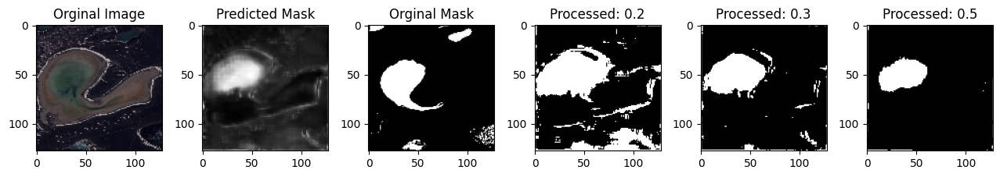

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8345 - loss: 0.1472
Epoch 67/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8373 - loss: 0.14


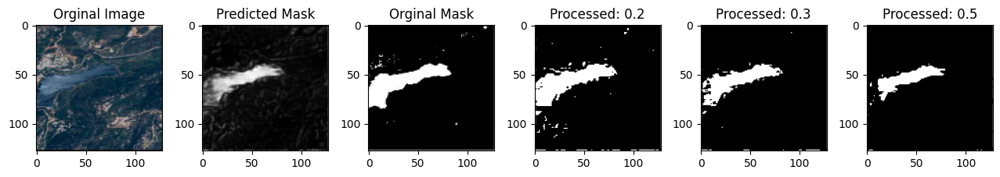

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8373 - loss: 0.1438
Epoch 68/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8283 - loss: 0.16


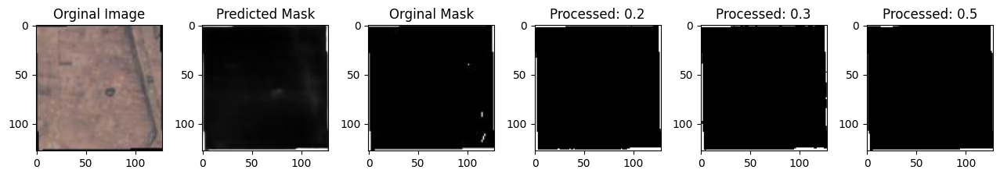

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8282 - loss: 0.1655
Epoch 69/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8271 - loss: 0.170


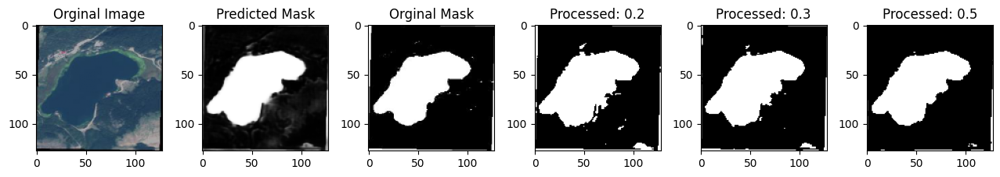

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8271 - loss: 0.1703
Epoch 70/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8348 - loss: 0.148


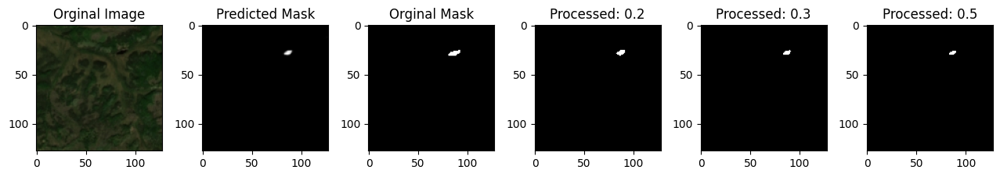

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8348 - loss: 0.1489
Epoch 71/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8277 - loss: 0.15


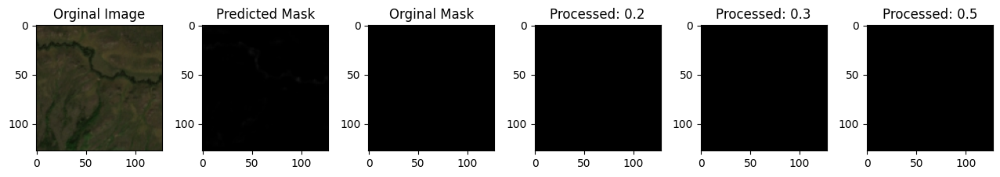

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8277 - loss: 0.1565
Epoch 72/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8332 - loss: 0.14


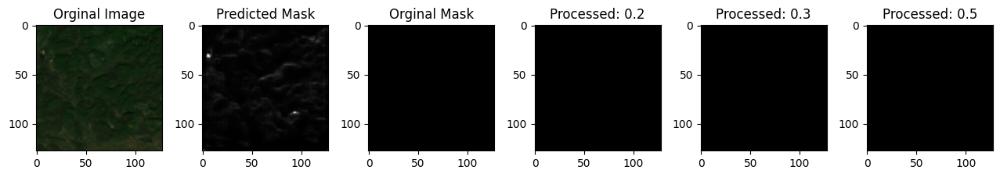

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.8332 - loss: 0.1477
Epoch 73/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8295 - loss: 0.15


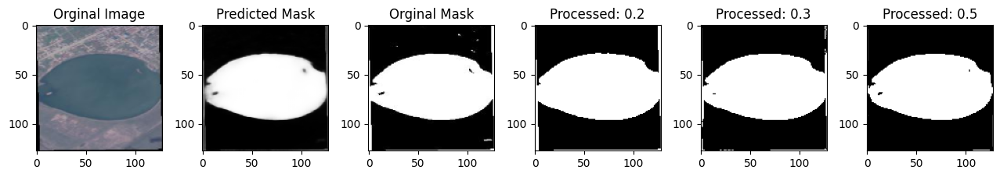

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8295 - loss: 0.1500
Epoch 74/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8323 - loss: 0.147


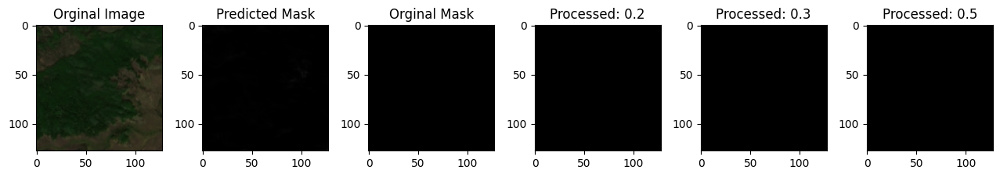

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8323 - loss: 0.1471
Epoch 75/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8305 - loss: 0.148


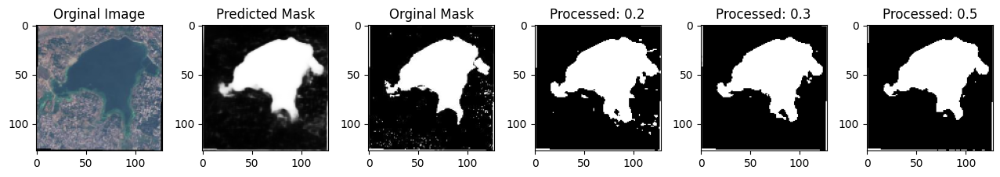

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8305 - loss: 0.1484
Epoch 76/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8335 - loss: 0.150


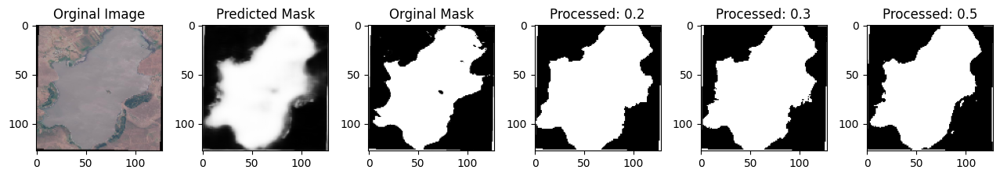

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8335 - loss: 0.1507
Epoch 77/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8358 - loss: 0.14


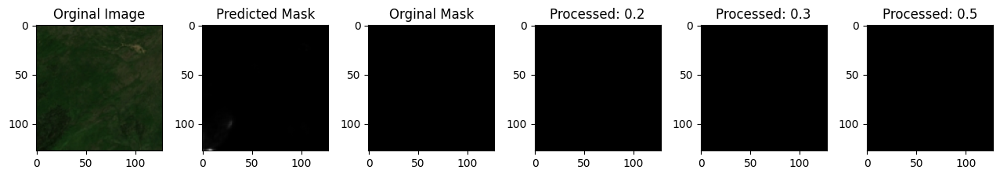

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8358 - loss: 0.1416
Epoch 78/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8350 - loss: 0.138


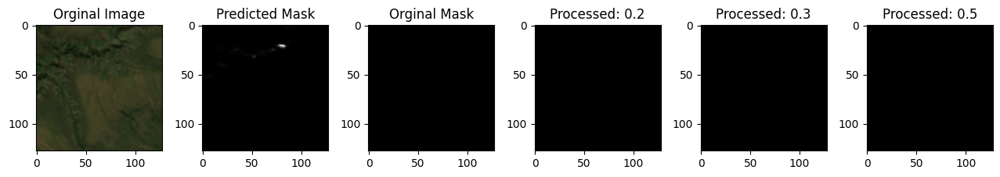

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8350 - loss: 0.1389
Epoch 79/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8308 - loss: 0.149


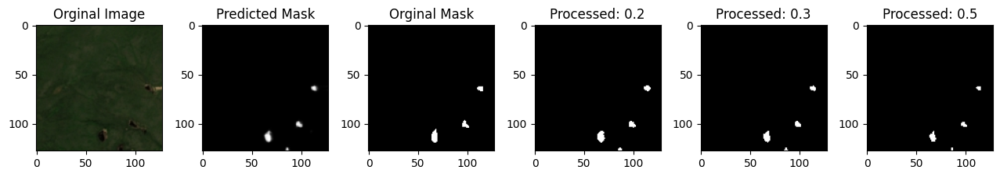

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8308 - loss: 0.1491
Epoch 80/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8360 - loss: 0.138


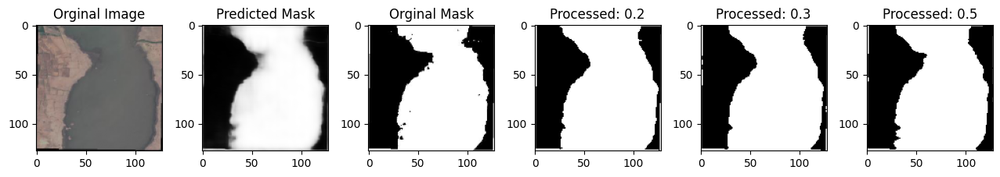

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8360 - loss: 0.1388
Epoch 81/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8296 - loss: 0.146


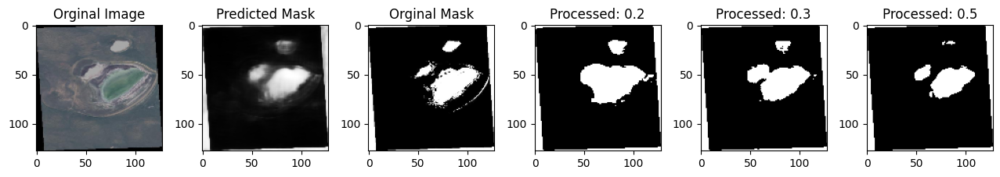

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8296 - loss: 0.1465
Epoch 82/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8314 - loss: 0.14


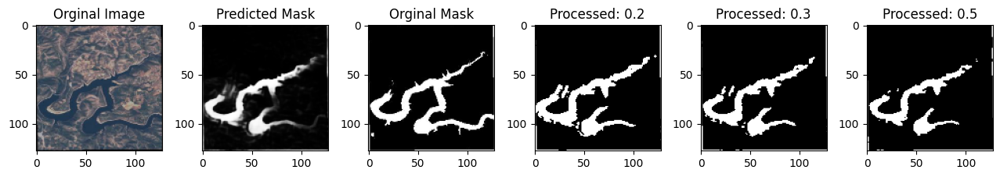

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8314 - loss: 0.1431
Epoch 83/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8406 - loss: 0.13


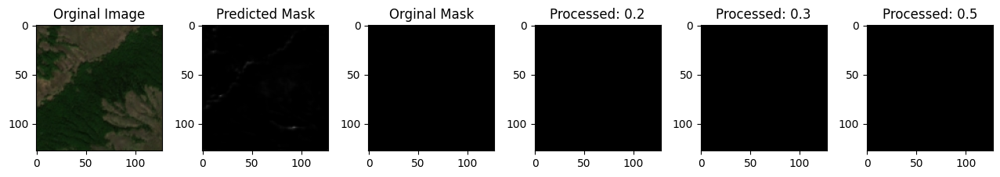

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8406 - loss: 0.1355
Epoch 84/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8350 - loss: 0.13


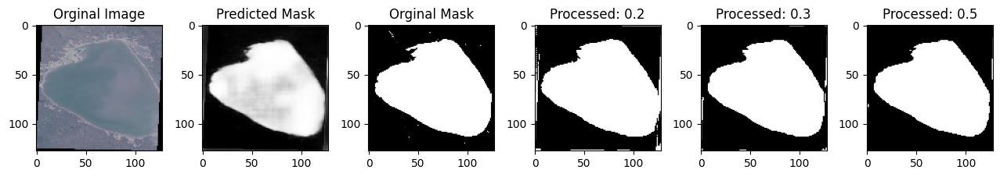

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8350 - loss: 0.1375
Epoch 85/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8371 - loss: 0.13


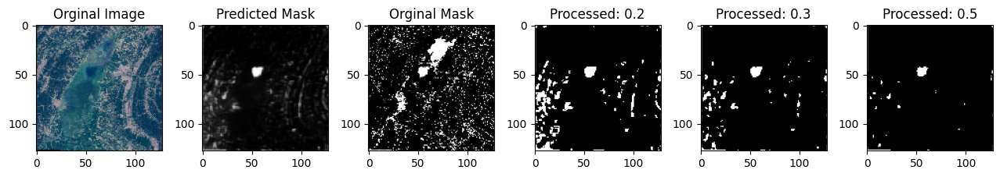

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8371 - loss: 0.1322
Epoch 86/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8349 - loss: 0.14


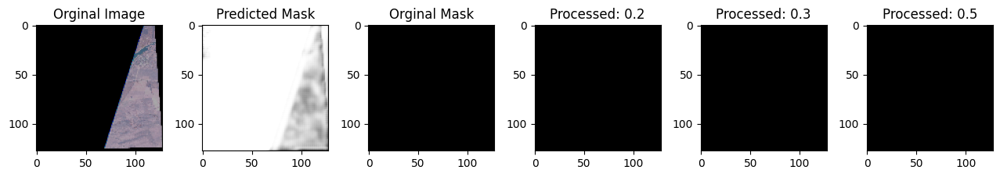

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8349 - loss: 0.1474
Epoch 87/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8344 - loss: 0.15


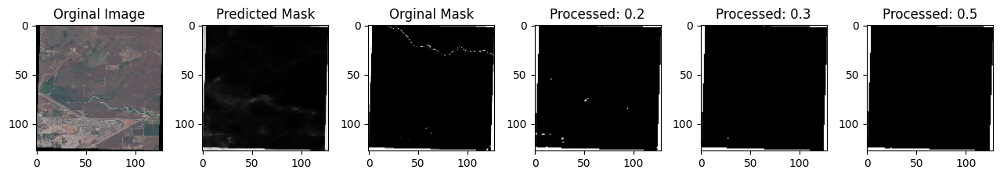

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8344 - loss: 0.1524
Epoch 88/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8332 - loss: 0.149


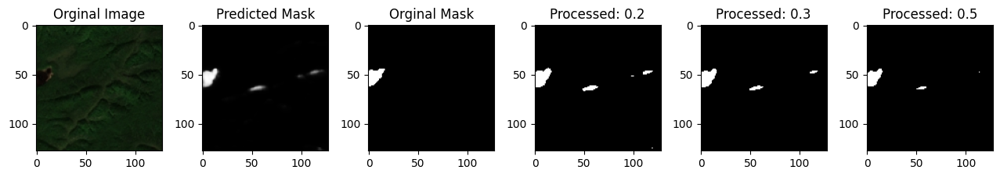

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8332 - loss: 0.1494
Epoch 89/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8352 - loss: 0.14


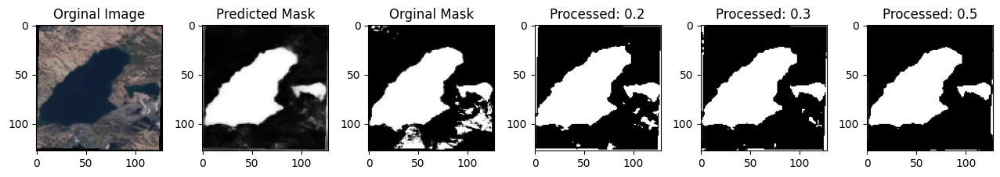

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8352 - loss: 0.1461
Epoch 90/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8352 - loss: 0.14


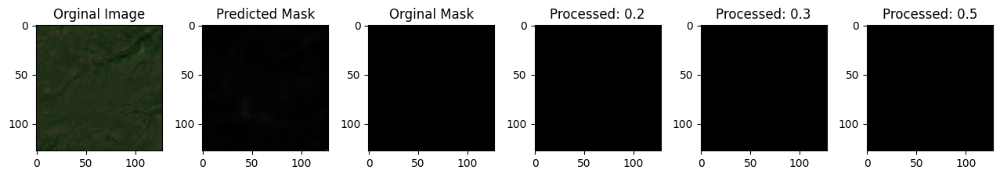

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8352 - loss: 0.1498
Epoch 91/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8367 - loss: 0.14


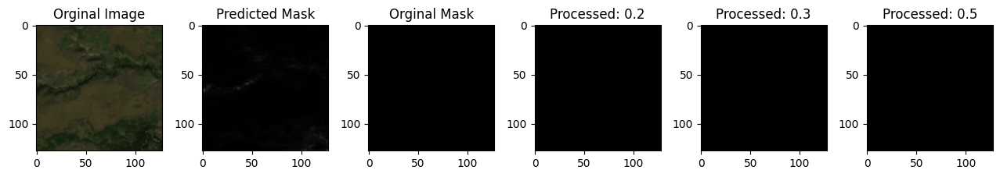

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8367 - loss: 0.1418
Epoch 92/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8337 - loss: 0.13


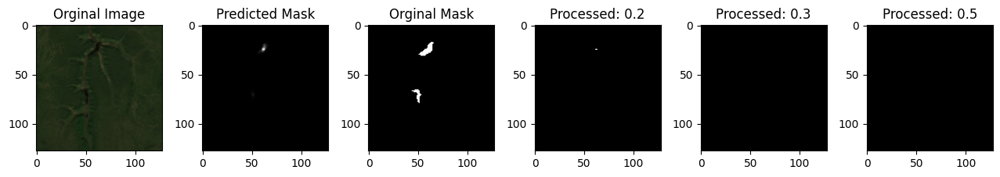

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8337 - loss: 0.1367
Epoch 93/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8376 - loss: 0.13


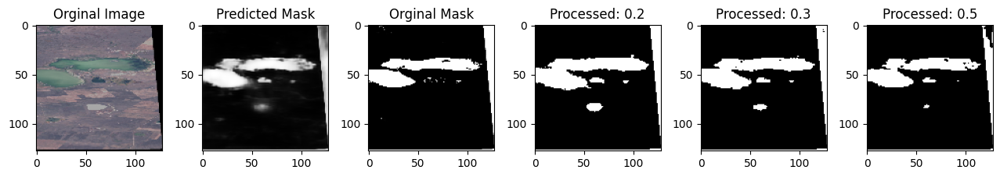

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.8376 - loss: 0.1334
Epoch 94/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8385 - loss: 0.132


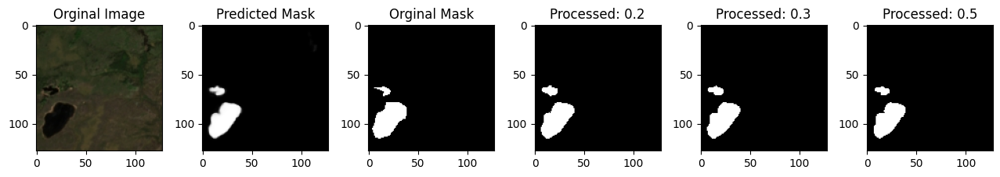

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step - accuracy: 0.8385 - loss: 0.1322
Epoch 95/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8400 - loss: 0.130


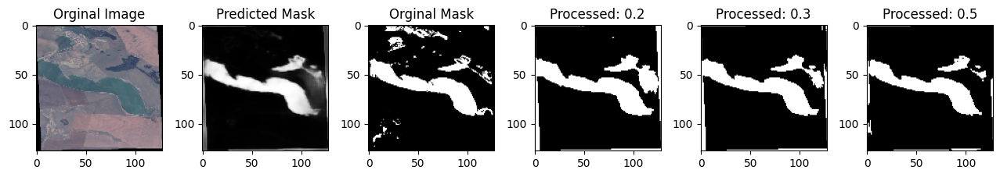

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.8400 - loss: 0.1308
Epoch 96/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8377 - loss: 0.132


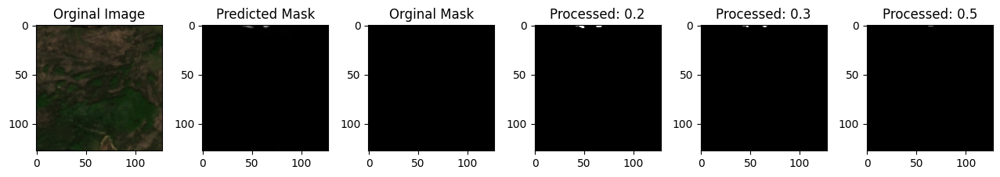

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.8377 - loss: 0.1325
Epoch 97/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8359 - loss: 0.132


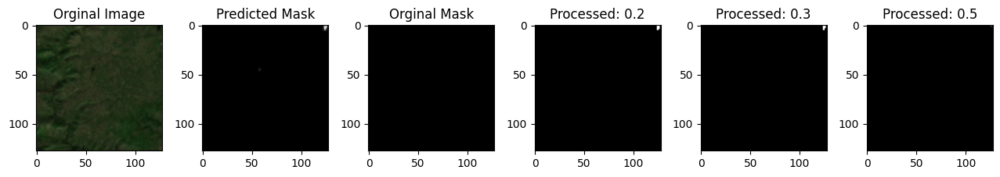

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8359 - loss: 0.1324
Epoch 98/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8351 - loss: 0.13


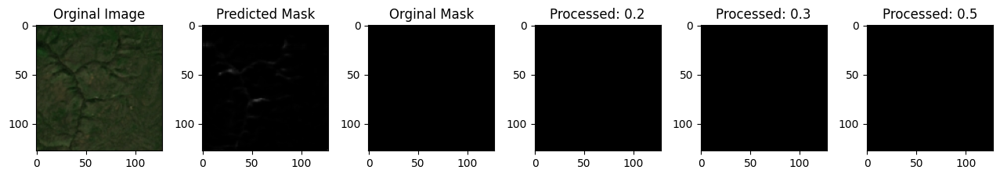

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8351 - loss: 0.1339
Epoch 99/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8353 - loss: 0.137


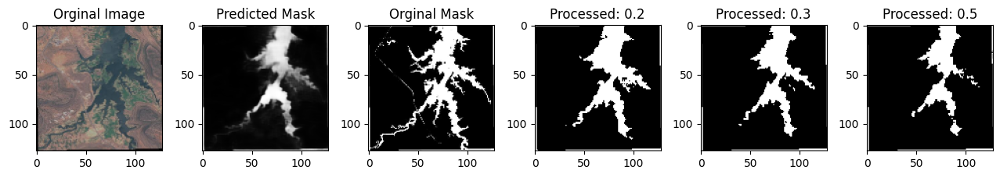

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8353 - loss: 0.1379
Epoch 100/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8374 - loss: 0.13


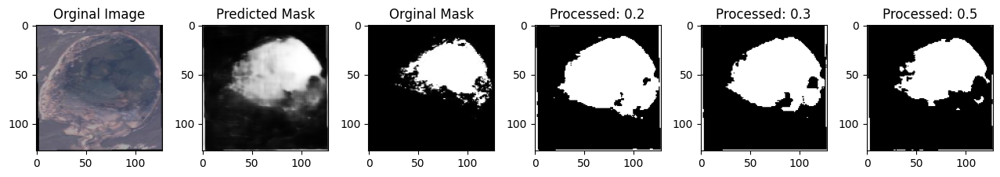

135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8374 - loss: 0.1329


In [8]:
# Training
epochs = 100
batch_size = 32

history = model.fit(images_train, mask_train,
                    epochs=epochs,
                    callbacks=[ShowProgress()],
                    batch_size=batch_size)

In [9]:
from datetime import datetime

# Get the current date and time
current_time = datetime.now().strftime('%Y-%m-%d_%H-%M-%S')

# Save the model with the current date and time in the filename
model.save(f'../models/{current_time}.keras')

In [29]:
# Make predictions
predictions = model.predict(images_test)

KeyError: 'pop from an empty set'